<a href="https://colab.research.google.com/github/Khushpanchal/Aadhar-Card-OCR-using-GANs/blob/master/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#Import drive
from google.colab import drive
drive.mount('/content/gdrive')

In [0]:
#Current directory
!pwd

In [0]:
#Make the following directory manually and put this notebook into it
%cd gdrive/My\ Drive/Colab\ Notebooks/OCR-e-adhaar

In [0]:
#Install Tesseract
!sudo apt install tesseract-ocr
!pip install pytesseract

In [5]:
# Clone the following github repo
!git clone https://github.com/xinntao/ESRGAN.git

Cloning into 'ESRGAN'...
remote: Enumerating objects: 210, done.
remote: Total 210 (delta 0), reused 0 (delta 0), pack-reused 210
Receiving objects: 100% (210/210), 24.85 MiB | 14.13 MiB/s, done.
Resolving deltas: 100% (76/76), done.


In [8]:
# Change the directoryy
%cd ESRGAN

/content/gdrive/My Drive/Colab Notebooks/OCR-e-adhaar/ESRGAN


In [0]:
# In test.py file change "device = torch.device('cuda') to device = torch.device('cpu')" if using CPU instead of GPU
# In test.py file change .png to .jpg in last line
# Use GPU for faster results

In [0]:
# Empty the LR folder and put test images into LR folder
# Use images with size < 100kb and use GPU for faster result
# Reduce the size of image if > 100 kB

In [0]:
# Download pretrained model from https://drive.google.com/file/d/1YKpJbosFgdpLK17nShIpYvyMn2yY5rpE/view?usp=sharing and put it into ESRGAN/model folder

In [0]:
#Run test.py
!python test.py

In [9]:
# Go back to parent directory
%cd ..

/content/gdrive/My Drive/Colab Notebooks/OCR-e-adhaar


In [0]:
#Import important libraries
import pytesseract
from pytesseract import Output
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import re
import os
import imutils
import glob

In [0]:
# Regular expression and validation of aadhar no.
def regex(text):
  uid = set()
  newlist = []
  for xx in text.split('\n'):
    newlist.append(xx)
  newlist = list(filter(lambda x: len(x) > 12, newlist))
  for no in newlist:
    if re.match("^[0-9 ]+$", no):
      uid.add(no)
  if(len(list(uid))>=1):
    # Validating using Verhoeff algorithm
    if(validate(list(uid)[0])):
      print(list(uid)[0])
      print('\n')
      return 1
    else:
      print('Invalid Aadhar no.')
      print('\n')
      return None
  else:
    return None

# Sharpen the image
def sharp(img):
  kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
  img = cv2.filter2D(img, -1, kernel)
  return img

# To validate aadhaar Num
def validate(aadhaarNum):

        aadhaarNum = aadhaarNum.split(" ")
        y = ""
        for i in aadhaarNum:
          y = y + i

        mult = [[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [1, 2, 3, 4, 0, 6, 7, 8, 9, 5], [2, 3, 4, 0, 1, 7, 8, 9, 5, 6],
            [3, 4, 0, 1, 2, 8, 9, 5, 6, 7], [4, 0, 1, 2, 3, 9, 5, 6, 7, 8], [5, 9, 8, 7, 6, 0, 4, 3, 2, 1],
            [6, 5, 9, 8, 7, 1, 0, 4, 3, 2], [7, 6, 5, 9, 8, 2, 1, 0, 4, 3], [8, 7, 6, 5, 9, 3, 2, 1, 0, 4],
            [9, 8, 7, 6, 5, 4, 3, 2, 1, 0]]

        perm = [[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [1, 5, 7, 6, 2, 8, 3, 0, 9, 4], [5, 8, 0, 3, 7, 9, 6, 1, 4, 2],
            [8, 9, 1, 6, 0, 4, 3, 5, 2, 7], [9, 4, 5, 3, 1, 2, 6, 8, 7, 0], [4, 2, 8, 6, 5, 7, 3, 9, 0, 1],
            [2, 7, 9, 3, 8, 0, 6, 4, 1, 5], [7, 0, 4, 6, 9, 1, 3, 2, 5, 8]]


        try:
            i = len(y)
            j = 0
            x = 0

            while i > 0:
                i -= 1
                x = mult[x][perm[(j % 8)][int(y[i])]]
                j += 1
            if x == 0:
                return 1 
            else:
                return 0 

        except ValueError:
            return 0 
        except IndexError:
            return 0 

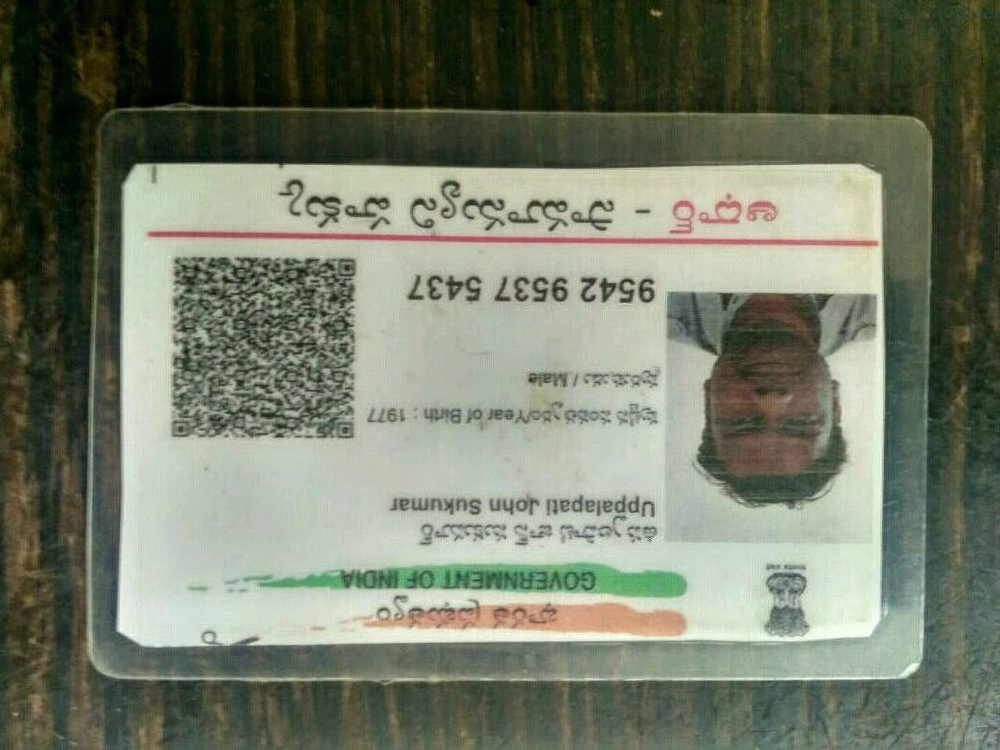

9542 9537 5437




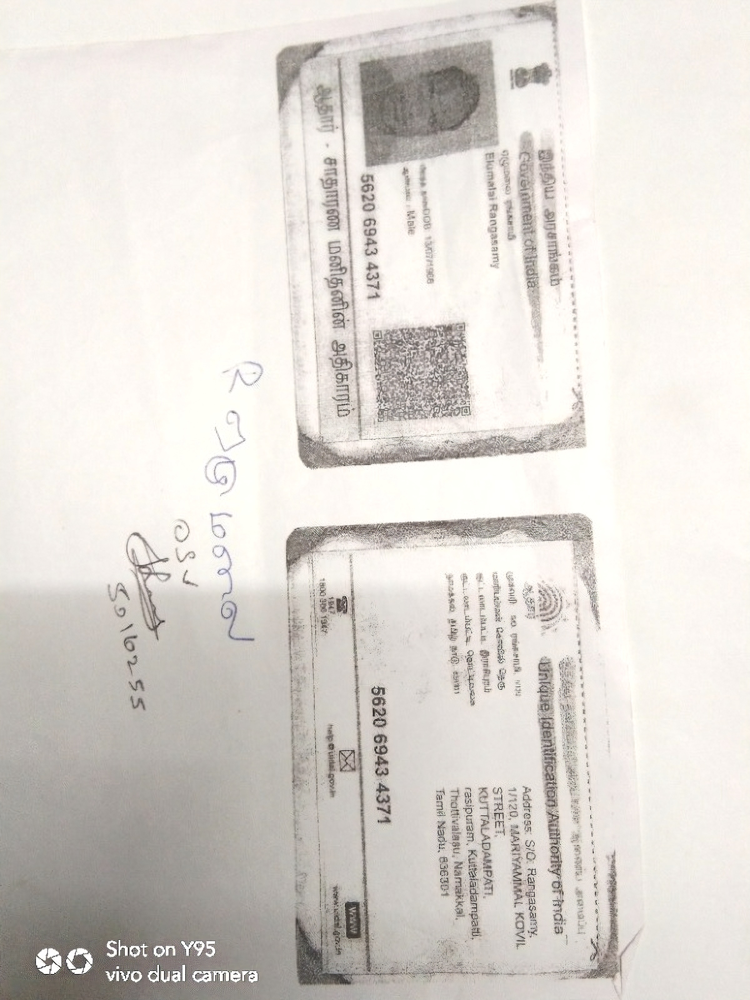

5620 6943 4371




In [80]:
# Extraction of aadhar card from different images
# LOGIC:- For each image extract aadhar card no. if not found 
#         sharpen the image and then found, if not found again
#         rotate the image by 90 degree and repeat the same process.

filenames = [img for img in glob.glob("ESRGAN/results/*.jpg")]
for img in filenames:
    im = cv2.imread(img)
    cv2_imshow(im)
    config = ('-l eng --oem 3 --psm 11')
    text = pytesseract.image_to_string(im, config=config)
    if(regex(text)):
      continue
    else:
      img = sharp(im)
      text = pytesseract.image_to_string(img, config=config)
      if(regex(text)): continue
      im = imutils.rotate(im, 90)
      text = pytesseract.image_to_string(im, config=config)
      if(regex(text)):
        continue
      else:
        img = sharp(im)
        text = pytesseract.image_to_string(img, config=config)
        if(regex(text)): continue
        im = imutils.rotate(im, 90)
        text = pytesseract.image_to_string(im, config=config)
        if(regex(text)):
          continue
        else:
          img = sharp(im)
          text = pytesseract.image_to_string(img, config=config)
          if(regex(text)): continue
          im = imutils.rotate(im, 90)
          text = pytesseract.image_to_string(im, config=config)
          if(regex(text)):
            continue
          else:
            img = sharp(im)
            text = pytesseract.image_to_string(img, config=config)
            if(regex(text)): continue
            print('None')
            print('\n')

In [0]:
# NOTE:- We can first ry to extract aadhar no., if not extracted than use GAN, it will save time.

In [0]:
# THINGS left to implement
# 1. Training SRGANN on our own text images
# 2. Masking of aadhar card.